
🔍 Processando: hamza-erbay-P5A-9mj4VLs-unsplash.jpg


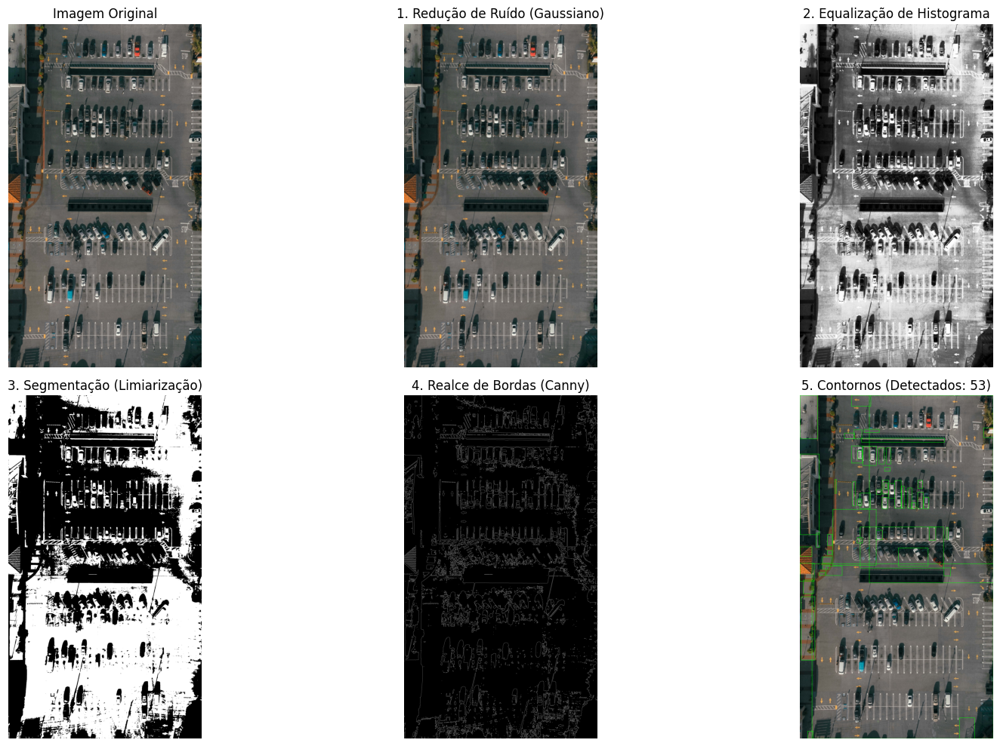


🔍 Processando: jonny-gios-I7IchiBJXUo-unsplash.jpg


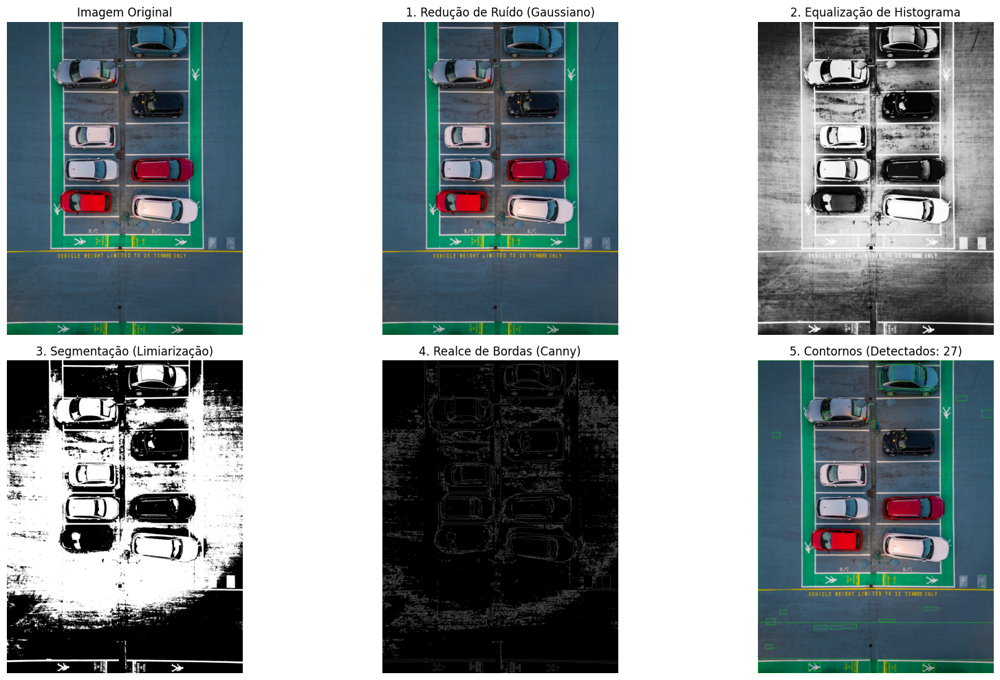


🔍 Processando: laryssa-ares-ky1Pd0Sa-3Q-unsplash.jpg


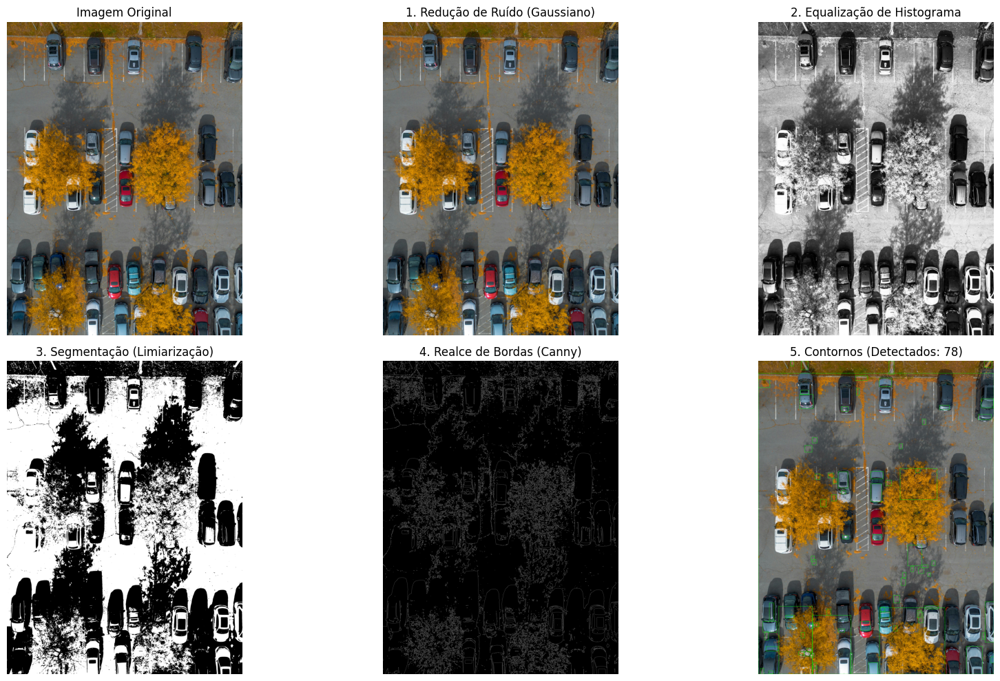


🔍 Processando: minsoo-eun-iH92JD8RIwc-unsplash.jpg


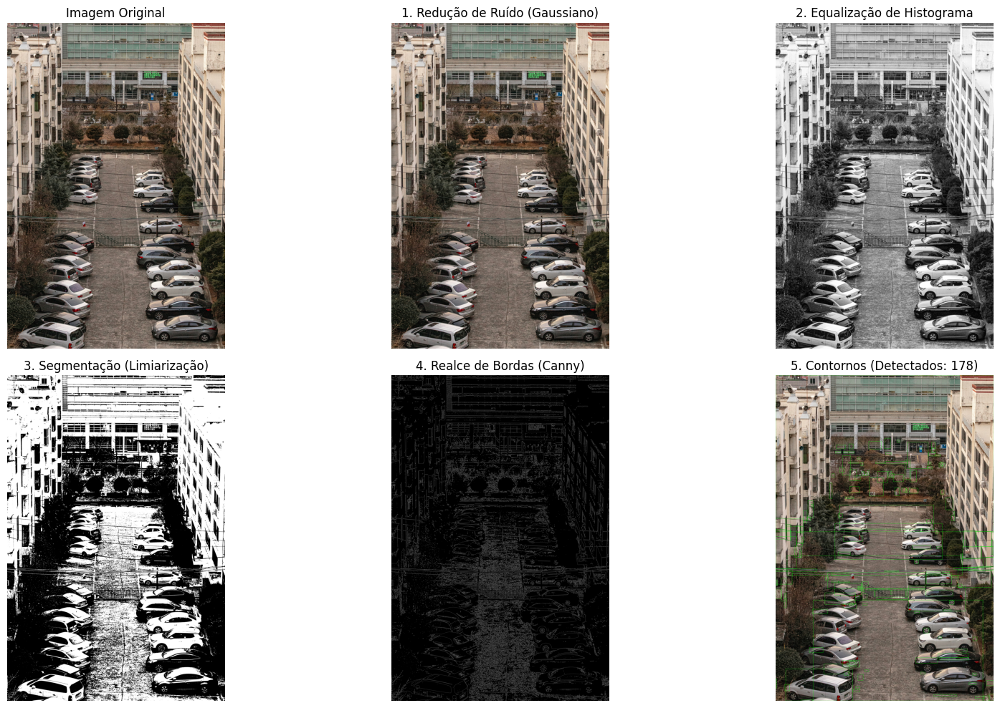


🔍 Processando: m-vMneecAwo34-unsplash.jpg


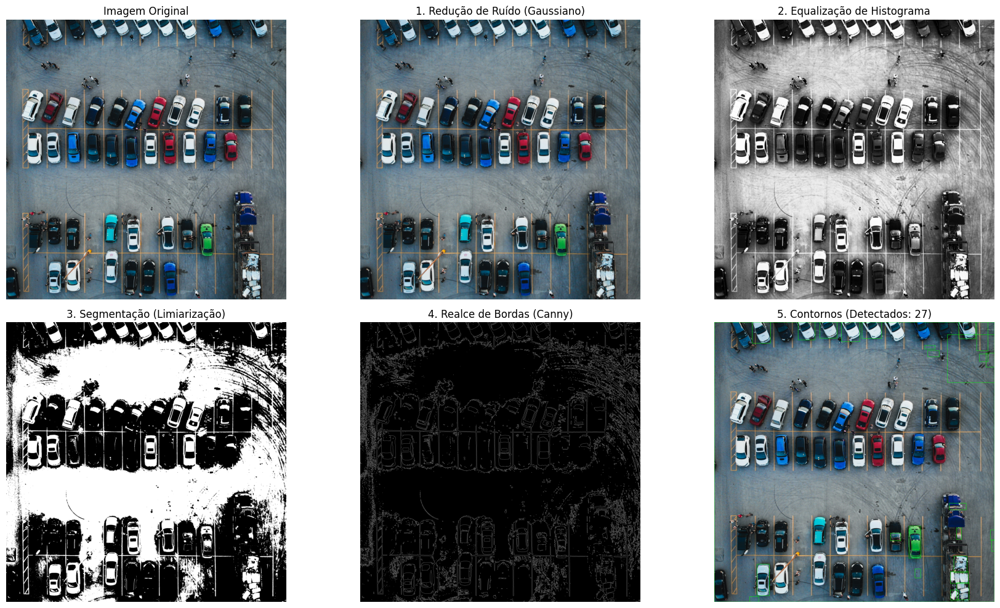


🔍 Processando: ronan-furuta-R6BseBIz90o-unsplash.jpg


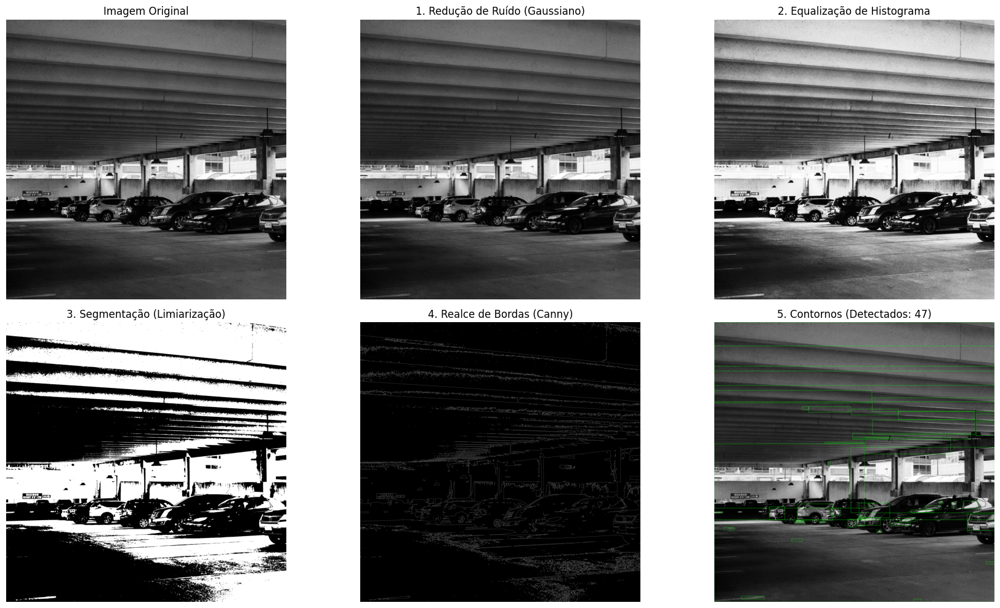

In [2]:
import cv2
import matplotlib.pyplot as plt
import os

# Lista de imagens (ajuste os caminhos conforme necessário)
image_paths = [
    "hamza-erbay-P5A-9mj4VLs-unsplash.jpg",
    "jonny-gios-I7IchiBJXUo-unsplash.jpg",
    "laryssa-ares-ky1Pd0Sa-3Q-unsplash.jpg",
    "minsoo-eun-iH92JD8RIwc-unsplash.jpg",
    "m-vMneecAwo34-unsplash.jpg",
    "ronan-furuta-R6BseBIz90o-unsplash.jpg"
]

# Parâmetros de detecção (ajuste se necessário)
MIN_CONTOUR_AREA = 1_000  # Descarta contornos muito pequenos


def process_image(path: str) -> None:
    """Processa uma única imagem sem usar YOLO, exibindo cada etapa."""
    print(f"\n🔍 Processando: {path}")
    # 0. Leitura
    image_bgr = cv2.imread(path)
    if image_bgr is None:
        raise FileNotFoundError(f"Não foi possível carregar a imagem: {path}")
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    # 1. Redução de ruído (Gaussiano)
    blurred = cv2.GaussianBlur(image_bgr, (5, 5), 0)

    # 2. Cinza + equalização de histograma
    gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
    equalized = cv2.equalizeHist(gray)

    # 3. Segmentação (limiarização simples)
    _, segmented = cv2.threshold(equalized, 127, 255, cv2.THRESH_BINARY)

    # 4. Realce de bordas (Canny)
    edges = cv2.Canny(segmented, 50, 150)

    # 5. "Detecção" simplificada por contornos
    contours, _ = cv2.findContours(segmented, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered = [cnt for cnt in contours if cv2.contourArea(cnt) >= MIN_CONTOUR_AREA]

    contoured_rgb = image_rgb.copy()
    for cnt in filtered:
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(contoured_rgb, (x, y), (x + w, y + h), (0, 255, 0), 2)

    object_count = len(filtered)

    # ---- Visualização ----
    fig, axs = plt.subplots(2, 3, figsize=(18, 10))
    axs[0, 0].imshow(image_rgb)
    axs[0, 0].set_title("Imagem Original")

    axs[0, 1].imshow(cv2.cvtColor(blurred, cv2.COLOR_BGR2RGB))
    axs[0, 1].set_title("1. Redução de Ruído (Gaussiano)")

    axs[0, 2].imshow(equalized, cmap='gray')
    axs[0, 2].set_title("2. Equalização de Histograma")

    axs[1, 0].imshow(segmented, cmap='gray')
    axs[1, 0].set_title("3. Segmentação (Limiarização)")

    axs[1, 1].imshow(edges, cmap='gray')
    axs[1, 1].set_title("4. Realce de Bordas (Canny)")

    axs[1, 2].imshow(contoured_rgb)
    axs[1, 2].set_title(f"5. Contornos (Detectados: {object_count})")

    for ax in axs.ravel():
        ax.axis('off')

    plt.tight_layout()
    plt.show()


if __name__ == "__main__":
    for img_path in image_paths:
        if os.path.exists(img_path):
            try:
                process_image(img_path)
            except Exception as err:
                print(f"⚠️  Erro ao processar {img_path}: {err}")
        else:
            print(f"🚫 Imagem não encontrada: {img_path}")
